## 13.
_Exercise: Go through KerasCV’s excellent [Stable Diffusion tutorial](https://keras.io/guides/keras_cv/generate_images_with_stable_diffusion/), and generate a beautiful
drawing of a salamander reading a book. If you post your best drawing on X, please tag him at @aureliengeron. He’d love to see your creations!_

###Overview

In this guide, we will show how to generate novel images based on a text prompt using the KerasCV implementation of stability.ai's text-to-image model, [Stable Diffusion](https://github.com/CompVis/stable-diffusion).

Stable Diffusion is a powerful, open-source text-to-image generation model. While there exist multiple open-source implementations that allow you to easily create images from textual prompts, KerasCV's offers a few distinct advantages. These include XLA compilation and mixed precision support, which together achieve state-of-the-art generation speed.

In this guide, we will explore KerasCV's Stable Diffusion implementation, show how to use these powerful performance boosts, and explore the performance benefits that they offer.

**Note:** To run this guide on the `torch` backend, please set `jit_compile=False` everywhere. XLA compilation for Stable Diffusion does not currently work with torch.

To get started, let's install a few dependencies and sort out some imports:

In [1]:
import time
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
!pip install tensorflow==2.15.0
!pip install keras==2.15.0
!pip install keras-cv==0.6.0
!pip install tensorflow-datasets==4.9.6
!pip install keras-core==0.1.7

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.5 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [3]:
import tensorflow as tf
import keras
import keras_cv
import tensorflow_datasets as tfds
import keras_core
import sys

print("Python version:", sys.version)
print("TensorFlow version:", tf.__version__)
print("Keras version:", keras.__version__)
print("Keras-CV version:", keras_cv.__version__)
print("TensorFlow Datasets version:", tfds.__version__)
print("Keras-Core version:", keras_core.__version__)

Using TensorFlow backend
Python version: 3.10.12 (main, Jul 29 2024, 16:56:48) [GCC 11.4.0]
TensorFlow version: 2.15.0
Keras version: 2.15.0
Keras-CV version: 0.6.0
TensorFlow Datasets version: 4.9.6
Keras-Core version: 0.1.7


###Introduction

Unlike most tutorials, where we first explain a topic then show how to implement it, with text-to-image generation it is easier to show instead of tell.

Check out the power of `keras_cv.models.StableDiffusion()`.

First, we construct a model:

In [16]:
model = keras_cv.models.StableDiffusion(
    img_width=512, img_height=512, jit_compile=False
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [17]:
def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")

Next, we give it a prompt:

In [19]:
#images = model.text_to_image("photograph of an astronaut riding a horse", batch_size=3)
#plot_images(images)

50/50 [==============================] - 141s 3s/step


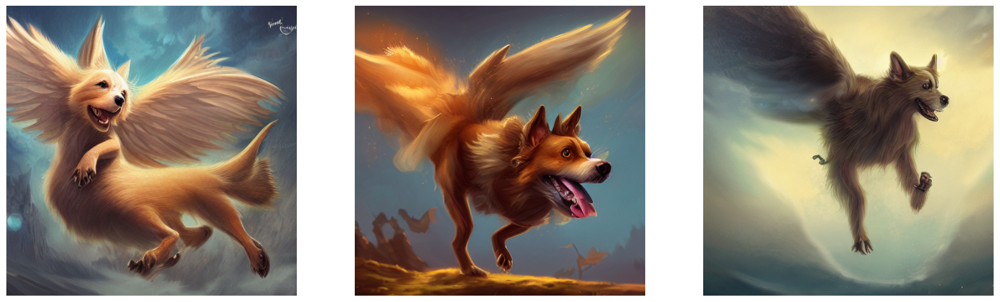

In [ ]:
images = model.text_to_image(
    "cute magical flying dog, fantasy art, "
    "golden color, high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting, mystery, adventure",
    batch_size=3,
)
plot_images(images)

###Perks of KerasCV

To get started, let's first benchmark our unoptimized model:

50/50 [==============================] - 88s 2s/step
Standard model: 90.82 seconds


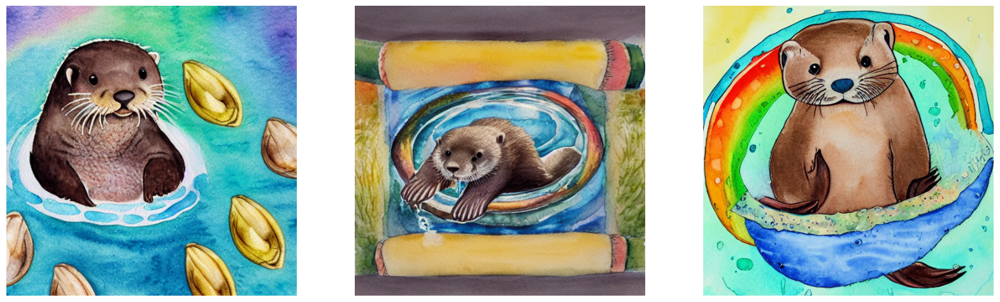

In [6]:
benchmark_result = []
start = time.time()
images = model.text_to_image(
    "A cute otter in a rainbow whirlpool holding shells, watercolor",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Standard", end - start])
plot_images(images)

print(f"Standard model: {(end - start):.2f} seconds")
keras.backend.clear_session()  # Clear session to preserve memory.

####Mixed precision

"Mixed precision" consists of performing computation using float16 precision, while storing weights in the float32 format. This is done to take advantage of the fact that float16 operations are backed by significantly faster kernels than their float32 counterparts on modern NVIDIA GPUs.

Enabling mixed precision computation in Keras (and therefore for keras_cv.models.StableDiffusion) is as simple as calling:

In [7]:
keras.mixed_precision.set_global_policy("mixed_float16")

That's all. Out of the box - it just works.

In [8]:
model = keras_cv.models.StableDiffusion(jit_compile=False)

print("Compute dtype:", model.diffusion_model.compute_dtype)
print(
    "Variable dtype:",
    model.diffusion_model.variable_dtype,
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
Compute dtype: float16
Variable dtype: float32


As you can see, the model constructed above now uses mixed precision computation; leveraging the speed of float16 operations for computation, while storing variables in float32 precision.

50/50 [==============================] - 60s 1s/step
Mixed precision model: 60.97 seconds


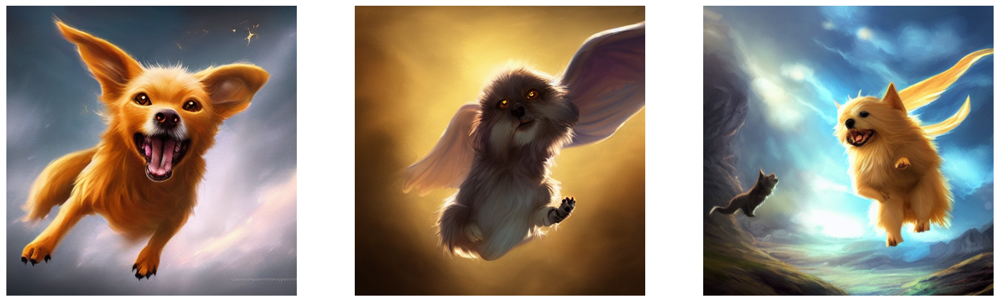

In [9]:
# Warm up model to run graph tracing before benchmarking.
model.text_to_image("warming up the model", batch_size=3)

start = time.time()
images = model.text_to_image(
    "a cute magical flying dog, fantasy art, "
    "golden color, high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting, mystery, adventure",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Mixed Precision", end - start])
plot_images(images)

print(f"Mixed precision model: {(end - start):.2f} seconds")
keras.backend.clear_session()

####XLA Compilation

TensorFlow and JAX come with the XLA: Accelerated Linear Algebra compiler built-in. keras_cv.models.StableDiffusion supports a jit_compile argument out of the box. Setting this argument to True enables XLA compilation, resulting in a significant speed-up.

Let's use this below:

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
198180272/198180272 [==============================] - 1s 0us/step


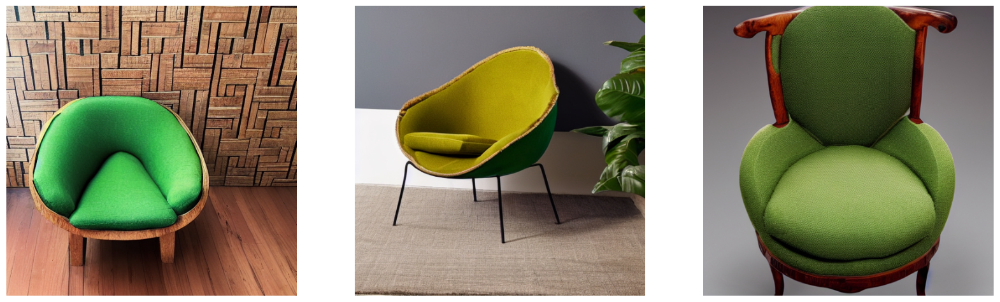

In [5]:
# Set back to the default for benchmarking purposes.
keras.mixed_precision.set_global_policy("float32")

model = keras_cv.models.StableDiffusion(jit_compile=True)
# Before we benchmark the model, we run inference once to make sure the TensorFlow
# graph has already been traced.
images = model.text_to_image("An avocado armchair", batch_size=3)
plot_images(images)

Let's benchmark our XLA model:

50/50 [==============================] - 66s 1s/step
With XLA: 121.08 seconds


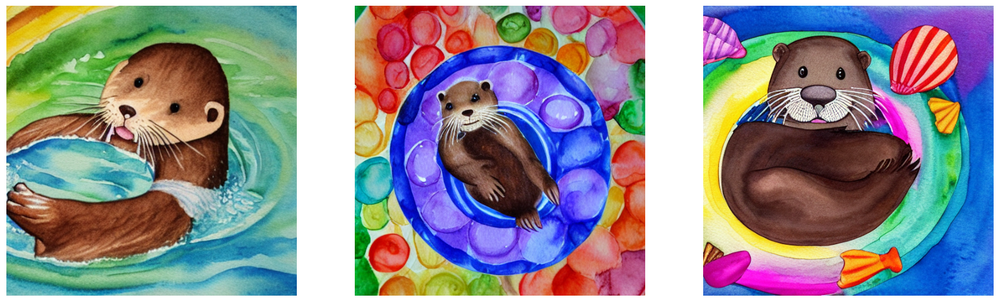

In [10]:
start = time.time()
images = model.text_to_image(
    "A cute otter in a rainbow whirlpool holding shells, watercolor",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["XLA", end - start])
plot_images(images)

print(f"With XLA: {(end - start):.2f} seconds")
keras.backend.clear_session()

On an A100 GPU, we get about a 2x speedup. Fantastic!

###Putting it all together

So, how do you assemble the world's most performant stable diffusion inference pipeline (as of September 2022).

With these two lines of code:

In [11]:
keras.mixed_precision.set_global_policy("mixed_float16")
model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


And to use it...

50/50 [==============================] - 140s 604ms/step


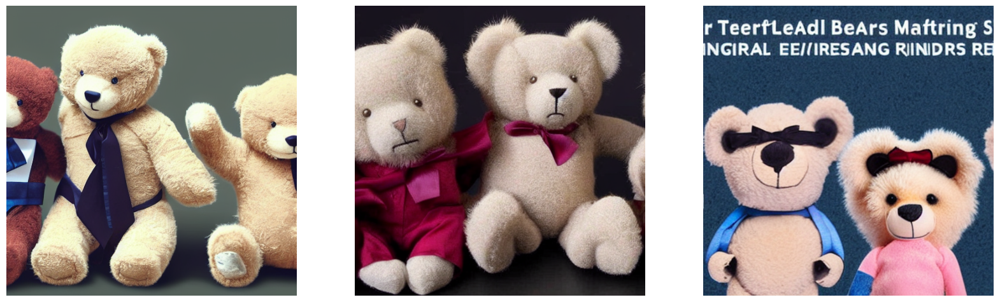

In [12]:
# Let's make sure to warm up the model
images = model.text_to_image(
    "Teddy bears conducting machine learning research",
    batch_size=3,
)
plot_images(images)

Exactly how fast is it? Let's find out!

50/50 [==============================] - 30s 595ms/step
XLA + mixed precision: 30.66 seconds


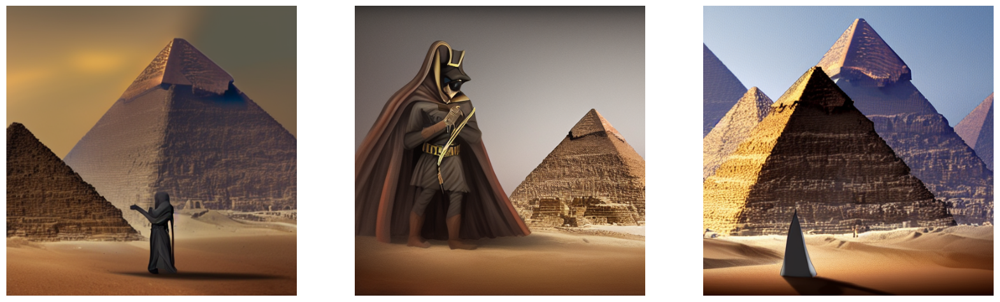

In [13]:
start = time.time()
images = model.text_to_image(
    "A mysterious dark stranger visits the great pyramids of egypt, "
    "high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["XLA + Mixed Precision", end - start])
plot_images(images)

print(f"XLA + mixed precision: {(end - start):.2f} seconds")

Let's check out the results:

In [14]:
print("{:<22} {:<22}".format("Model", "Runtime"))
for result in benchmark_result:
    name, runtime = result
    print("{:<22} {:<22}".format(name, runtime))

Model                  Runtime               
Standard               90.81825971603394     
Mixed Precision        60.97073984146118     
XLA                    121.0840015411377     
XLA + Mixed Precision  30.657634973526       


It only took our fully-optimized model four seconds to generate three novel images from a text prompt on an A100 GPU.

###Conclusions

KerasCV offers a state-of-the-art implementation of Stable Diffusion – and through the use of XLA and mixed precision, it delivers the fastest Stable Diffusion pipeline available as of September 2022.

Normally, at the end of a keras.io tutorial we leave you with some future directions to continue in to learn. This time, we leave you with one idea:

Go run your own prompts through the model! It is an absolute blast!

If you have your own NVIDIA GPU, or a M1 MacBookPro, you can also run the model locally on your machine. (Note that when running on a M1 MacBookPro, you should not enable mixed precision, as it is not yet well supported by Apple's Metal runtime.)